#  Import necessary libraries 💼

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from wordcloud import WordCloud
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report, confusion_matrix
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

from transformers import BertTokenizer, TFBertForSequenceClassification
from sklearn.model_selection import train_test_split
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import SparseCategoricalCrossentropy
from tensorflow.keras.metrics import SparseCategoricalAccuracy

from tensorflow.keras.layers import Bidirectional

# Dataset Overview 📊📚

In [2]:
df = pd.read_csv('/kaggle/input/emotions/text.csv')
df

FileNotFoundError: [Errno 2] No such file or directory: '/kaggle/input/emotions/text.csv'

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 416809 entries, 0 to 416808
Data columns (total 3 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   Unnamed: 0  416809 non-null  int64 
 1   text        416809 non-null  object
 2   label       416809 non-null  int64 
dtypes: int64(2), object(1)
memory usage: 9.5+ MB


In [ ]:
df.describe()

,Unnamed: 0,label
count,416809.000000,416809.000000
mean,208404.000000,1.554271
std,120322.538513,1.490453
min,0.000000,0.000000
25%,104202.000000,0.000000
50%,208404.000000,1.000000
75%,312606.000000,3.000000
max,416808.000000,5.000000


In [ ]:
df['label'].value_counts()

label
1    141067
0    121187
3     57317
4     47712
2     34554
5     14972
Name: count, dtype: int64

# Data Exploration 🕵️‍♂️📈

In [ ]:
# Mapping numerical labels to emotion names
emotion_mapping = {0: 'Sadness', 1: 'Joy', 2: 'Love', 3: 'Anger', 4: 'Fear', 5: 'Surprise'}
df['emotion_name'] = df['label'].map(emotion_mapping)

In [ ]:
# Plot interactive pie chart for emotion distribution
emotion_distribution = df['emotion_name'].value_counts().reset_index()
emotion_distribution.columns = ['Emotion', 'Count']

fig = px.pie(emotion_distribution, names='Emotion', values='Count', title='Emotion Distribution')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

In [ ]:
# Visualize the distribution of emotions using an interactive histogram
fig = px.histogram(df, x='emotion_name', title='Emotion Distribution',
                   labels={'emotion_name': 'Emotion Label', 'count': 'Number of Tweets'})
fig.update_layout(bargap=0.1)
fig.show()

In [ ]:
# Explore correlations between text length and emotions
fig = px.scatter(df, x=df['text'].apply(len), y='emotion_name', title='Correlation between Text Length and Emotions',
                 labels={'x': 'Text Length', 'y': 'Emotion Label'})
fig.update_traces(marker=dict(size=8, color='blue'), selector=dict(mode='markers'))
fig.show()

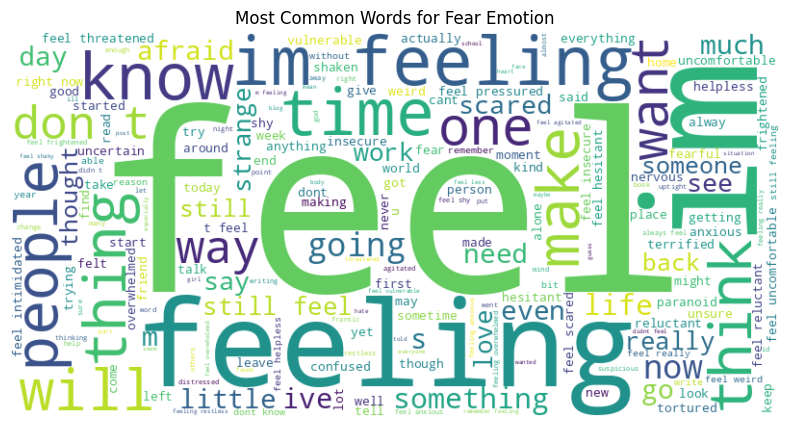

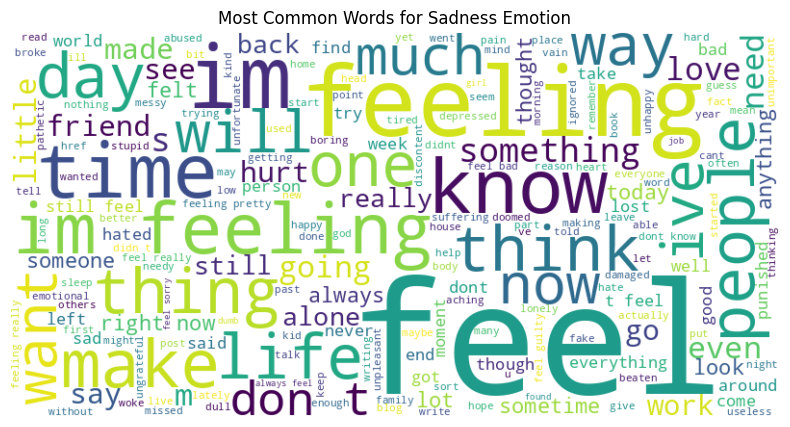

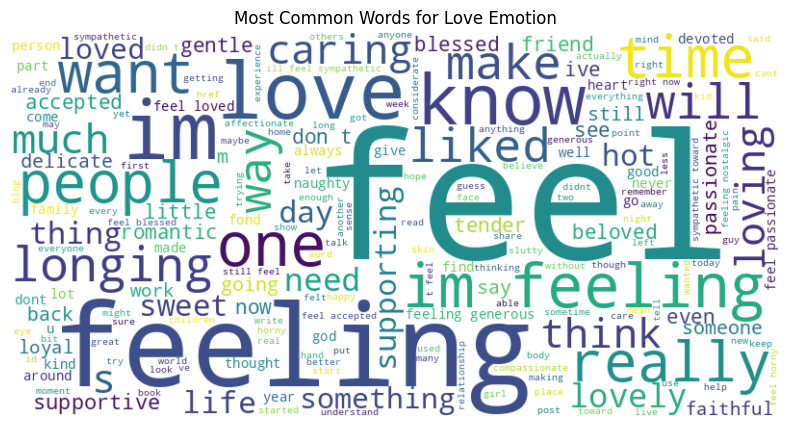

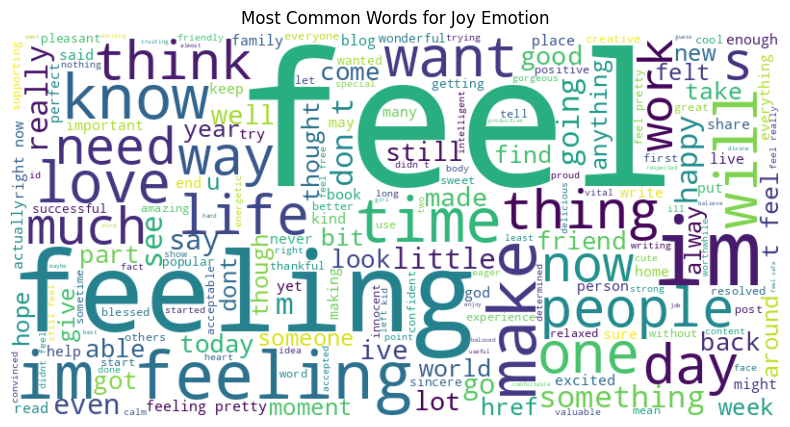

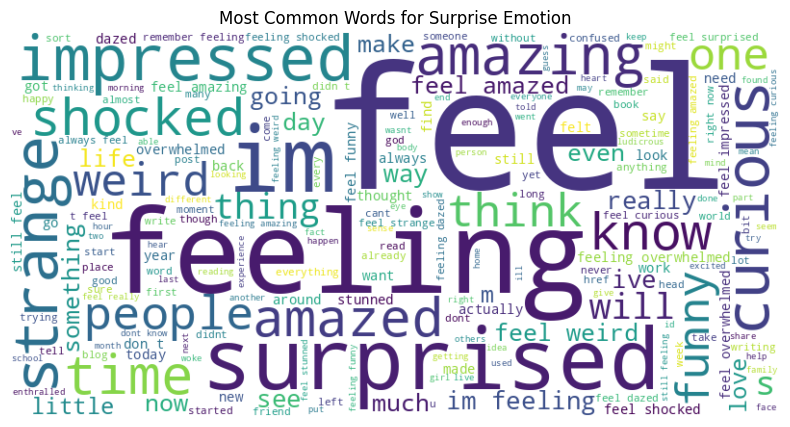

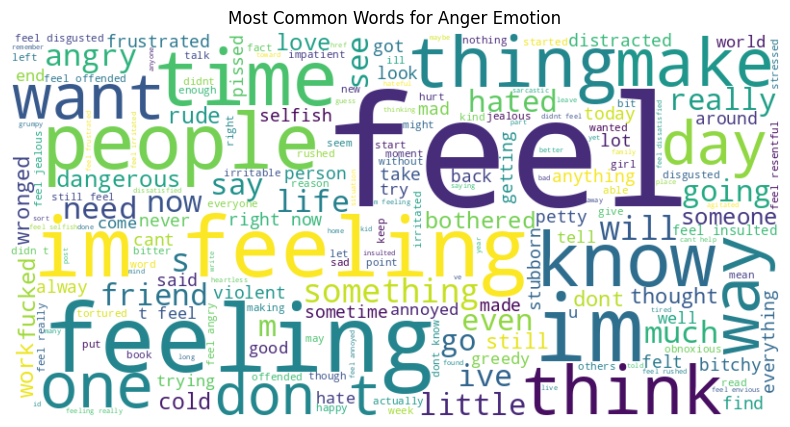

In [ ]:
emotions = df['emotion_name'].unique()
for emotion in emotions:
    words = ' '.join(df[df['emotion_name'] == emotion]['text'])
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(words)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Most Common Words for {emotion} Emotion')
    plt.show()

# Text Preprocessing 📝✂️

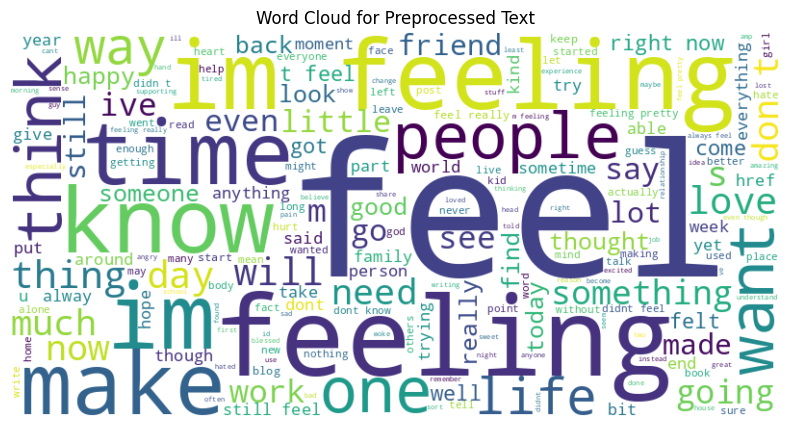

In [ ]:
# Function for text preprocessing
def preprocess_text(text):
    # Convert to lowercase
    text = text.lower()
    # Remove special characters, links, and numbers
    text = ' '.join([word for word in text.split() if word.isalpha()])
    # Add more preprocessing steps if necessary

    return text

# Apply text preprocessing to the entire dataset
df['preprocessed_text'] = df['text'].apply(preprocess_text)

# Display a few examples of preprocessed text
# print("\nSample of Preprocessed Text:")
# print(df[['text', 'preprocessed_text']].head())

# Visualize word cloud for preprocessed text
preprocessed_words = ' '.join(df['preprocessed_text'])
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(preprocessed_words)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for Preprocessed Text')
plt.show()

# Splitting the Dataset 🔄📊

In [ ]:
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(df['preprocessed_text'], df['label'], test_size=0.2, random_state=42)

# Display the shapes of the training and testing sets
print("\nShapes of Training and Testing Sets:")
print("X_train:", X_train.shape)
print("X_test:", X_test.shape)
print("y_train:", y_train.shape)
print("y_test:", y_test.shape)


Shapes of Training and Testing Sets:
X_train: (333447,)
X_test: (83362,)
y_train: (333447,)
y_test: (83362,)


# Text Vectorization using TF-IDF 📊🔠

In [ ]:
# (TF-IDF) -> Term Frequency - Inverse Document Frequency

# Initialize the TF-IDF vectorizer
tfidf_vectorizer = TfidfVectorizer(max_features=5000)

# Fit and transform the training set
X_train_tfidf = tfidf_vectorizer.fit_transform(X_train)

# Transform the test set
X_test_tfidf = tfidf_vectorizer.transform(X_test)

# Display the shapes of the TF-IDF matrices
print("\nShapes of TF-IDF Matrices:")
print("X_train_tfidf:", X_train_tfidf.shape)
print("X_test_tfidf:", X_test_tfidf.shape)


Shapes of TF-IDF Matrices:
X_train_tfidf: (333447, 5000)
X_test_tfidf: (83362, 5000)


# Naive Bayes Classifier Training 🤖🧠

In [ ]:
# Initialize the Naive Bayes classifier
naive_bayes_classifier = MultinomialNB()

# Train the classifier on the TF-IDF transformed training set
naive_bayes_classifier.fit(X_train_tfidf, y_train)

# Predict on the test set
y_pred = naive_bayes_classifier.predict(X_test_tfidf)

# Evaluate the classifier
accuracy = (y_pred == y_test).mean()
accuracy

0.831625920683285

# Deep Learning Model Development 🌐🤖

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, Bidirectional, LSTM, Dense
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(df['preprocessed_text'], df['label'], test_size=0.2, random_state=42)

# Initialize the Tokenizer
tokenizer = Tokenizer(num_words=5000)
tokenizer.fit_on_texts(X_train)

# Convert text to sequences and pad them
X_train_padded = pad_sequences(tokenizer.texts_to_sequences(X_train), maxlen=100, padding='post')
X_test_padded = pad_sequences(tokenizer.texts_to_sequences(X_test), maxlen=100, padding='post')

# Build a Sequential model with bidirectional LSTM
model = Sequential()
model.add(Embedding(input_dim=5000, output_dim=16, input_length=100))
model.add(Bidirectional(LSTM(units=64)))
model.add(Dense(units=6, activation='softmax'))

# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Display the model summary
model.summary()

# Train the model
history = model.fit(X_train_padded, y_train, epochs=5, validation_data=(X_test_padded, y_test))

# Evaluate the model
loss, accuracy = model.evaluate(X_test_padded, y_test)
print(f'\nTest Accuracy (LSTM): {accuracy}')

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 100, 16)           80000     
                                                                 
 bidirectional (Bidirection  (None, 128)               41472     
 al)                                                             
                                                                 
 dense (Dense)               (None, 6)                 774       
                                                                 
Total params: 122246 (477.52 KB)
Trainable params: 122246 (477.52 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/5


I0000 00:00:1707164565.496273      74 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


10421/10421 [==============================] - 135s 13ms/step - loss: 0.2758 - accuracy: 0.8854 - val_loss: 0.1182 - val_accuracy: 0.9349
Epoch 2/5
10421/10421 [==============================] - 105s 10ms/step - loss: 0.1079 - accuracy: 0.9365 - val_loss: 0.1052 - val_accuracy: 0.9366
Epoch 3/5
10421/10421 [==============================] - 104s 10ms/step - loss: 0.0961 - accuracy: 0.9401 - val_loss: 0.1043 - val_accuracy: 0.9375
Epoch 4/5
10421/10421 [==============================] - 104s 10ms/step - loss: 0.0919 - accuracy: 0.9415 - val_loss: 0.0966 - val_accuracy: 0.9375
Epoch 5/5
2606/2606 [==============================] - 12s 5ms/step - loss: 0.0947 - accuracy: 0.9389

Test Accuracy (LSTM): 0.9389050006866455


In [ ]:
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.preprocessing.text import Tokenizer

# Example new text data
new_text_data = ["I'm not good"]

# Use the same tokenizer as used during training
tokenizer = Tokenizer(num_words=5000)  # Assuming the same vocabulary size
tokenizer.fit_on_texts(new_text_data)

# Convert the text to sequences and pad them
new_sequences = tokenizer.texts_to_sequences(new_text_data)
new_padded = pad_sequences(new_sequences, maxlen=100, padding='post')  # Assuming the same maximum length

# Now, you can use the model to make predictions on this new data
predictions = model.predict(new_padded)

# Get the predicted class labels
predicted_labels = predictions.argmax(axis=1)

# Map label indices to class names
class_mapping = {0: 'Sadness', 1: 'Joy', 2: 'Love', 3: 'Anger', 4: 'Fear', 5: 'Surprise'}
predicted_class_names = [class_mapping[label] for label in predicted_labels]

# Print or use the predicted class names as needed
print(predicted_class_names)

1/1 [==============================] - 1s 720ms/step
['Sadness']
